# AMBULANCE DISTRIBUTION SYSTEM

#### Life cycle of a Machine Learning Project

- Understanding the Problem Statement
- Data Collection
- Data Checks to perform
- Exploratory data analysis
- Data Pre-Processing
- Model Training
- Choose best model

#### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import osmnx as ox
import geopandas as gpd
import networkx as nx
import folium
import csv

In [2]:
from folium.plugins import HeatMap
from geopy.distance import geodesic
from IPython.display import display, HTML
from geopy.geocoders import Nominatim
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

#### 1) Problem Statement

-  How can AI and machine learning models using real-time ambulance tracking, traffic conditions, and historical emergency response data be developed to optimize ambulance dispatch and routing? Can predictive models anticipate areas of high emergency incidence and proactively position ambulances to reduce response times and improve patient survival outcomes?

#### 2) Data Collection

- First we need to make the data ingestion easy and useful then we should proceed with transformation or any sort of changes.

In [4]:
df=pd.read_csv('data/final_dataset.csv')

## Overview of the dataset


In [5]:
# First 5 rows
print(df.head())  

  license_plate serviceOnDuty  \
0     KA51G5226            NO   
1      KA40G471            NO   
2     KA51G5240           YES   
3     KA51G5028            NO   
4     KA51G5253           YES   

                                                  id  \
0  datakaveri.org/fb0924bef803e220e0d0bc8ceaf0a1f...   
1  datakaveri.org/fb0924bef803e220e0d0bc8ceaf0a1f...   
2  datakaveri.org/fb0924bef803e220e0d0bc8ceaf0a1f...   
3  datakaveri.org/fb0924bef803e220e0d0bc8ceaf0a1f...   
4  datakaveri.org/fb0924bef803e220e0d0bc8ceaf0a1f...   

         observationDateTime location.type    location.coordinates  \
0  2022-01-31 18:30:01+00:00         Point  [77.668716, 13.133616]   
1  2022-01-31 18:30:04+00:00         Point  [77.609283, 12.941375]   
2  2022-01-31 18:30:05+00:00         Point  [77.711296, 12.801156]   
3  2022-01-31 18:30:05+00:00         Point  [77.542618, 12.976893]   
4  2022-01-31 18:30:06+00:00         Point  [77.400681, 12.965804]   

  emergencyVehicleType  location.longitudes

In [6]:
# Data types and non-null counts
print(df.info()) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74 entries, 0 to 73
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   license_plate          74 non-null     object 
 1   serviceOnDuty          74 non-null     object 
 2   id                     74 non-null     object 
 3   observationDateTime    74 non-null     object 
 4   location.type          74 non-null     object 
 5   location.coordinates   74 non-null     object 
 6   emergencyVehicleType   46 non-null     object 
 7   location.longitudes    74 non-null     float64
 8   location.latitudes     74 non-null     float64
 9   coordinates_formatted  74 non-null     object 
dtypes: float64(2), object(8)
memory usage: 5.9+ KB
None


In [7]:
# Summary statistics
print(df.describe())  

       location.longitudes  location.latitudes
count            74.000000           74.000000
mean             77.583972           12.970570
std               0.075337            0.073386
min              77.370438           12.779058
25%              77.545201           12.938666
50%              77.581479           12.973029
75%              77.616076           13.009431
max              77.782578           13.172339


# 3. Data Checks to Perform
- Here are the checks you should do for the dataset:

- Check Missing Values: Identify columns with missing data.
 - Check for Duplicates: Ensure no duplicate rows exist.
 - Check Data Types: Ensure the data types are appropriate for each feature.
 - Count Unique Values: Check the number of unique values in each column.
 - Statistics of the Dataset: Review summary statistics (mean, median, etc.).
 - Check Categories for Categorical Columns: List unique values for categorical columns (e.g., vehicleType, serviceOnDuty).

In [8]:
# 1. Check missing values
print("Missing Values:\n", df.isnull().sum())

Missing Values:
 license_plate             0
serviceOnDuty             0
id                        0
observationDateTime       0
location.type             0
location.coordinates      0
emergencyVehicleType     28
location.longitudes       0
location.latitudes        0
coordinates_formatted     0
dtype: int64


In [9]:
# 2. Check duplicates
print("Number of Duplicates:", df.duplicated().sum())

Number of Duplicates: 0


In [10]:
# 2(a) Removing duplicates
df = df.drop_duplicates()
print("Number of Duplicates:", df.duplicated().sum())

Number of Duplicates: 0


In [11]:
# 3. Check data types
print("Data Types:\n", df.dtypes)

Data Types:
 license_plate             object
serviceOnDuty             object
id                        object
observationDateTime       object
location.type             object
location.coordinates      object
emergencyVehicleType      object
location.longitudes      float64
location.latitudes       float64
coordinates_formatted     object
dtype: object


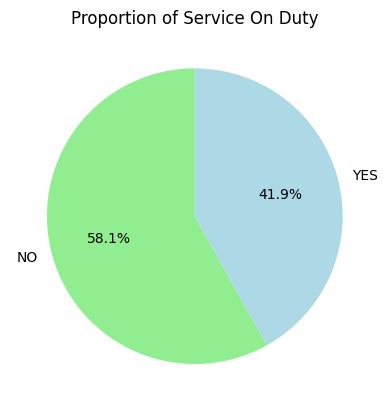

In [12]:
# Pie chart for services on duty
service_counts = df['serviceOnDuty'].value_counts()
# Plot pie chart
service_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=['lightgreen', 'lightblue'])
plt.title("Proportion of Service On Duty")
plt.ylabel("")  # Remove default ylabel
plt.show()

In [11]:
# 5. Descriptive statistics
print("Statistics:\n", df.describe())

Statistics:
          longitude01     latitude01
count  688015.000000  688015.000000
mean       77.571622      12.956021
std         0.874906       0.164065
min         0.000000       0.000000
25%        77.542442      12.920617
50%        77.579910      12.961146
75%        77.604172      12.996755
max        77.851830      13.202518


In [12]:
# 6. Check categories in categorical columns
categorical_columns = ['emergencyVehicleType', 'serviceOnDuty']
for col in categorical_columns:
    print(f"Categories in {col}:", df[col].unique())

Categories in emergencyVehicleType: ['AMBULANCE' 'MOTORCYCLE AMBULANCE']
Categories in serviceOnDuty: ['YES' 'NO']


## 4. Exploring Data (Visualization)
 - You can use the following visualizations to understand the dataset better:

 - 
 - Bar Charts for Categorical Data:

 - Analyze the count of vehicle types or services on duty.
 - Univariate Analysis (Histograms):

 - Analyze distributions of numeric features like response time or number of vehicles.
 - Pie Charts:

 - Show proportions of categorical variables like serviceOnDuty.
 - Scatter Plots:

 - Visualize the spatial distribution of ambulances across coordinates.
 - Time Series Analysis:

 - Plot data based on the observationDateTime to understand trends over time.You can use the following  visualizations to understand the dataset better:

    - Heatmap for Geospatial Data (Folium HeatMap):

    - Show areas with the highest density of emergency vehicles or incidents.
    - Bar Charts for Categorical Data:

 - Analyze the count of vehicle types or services on duty.
 - Univariate Analysis (Histograms):

 - Analyze distributions of numeric features like response time or number of vehicles.
 - Pie Charts:

 - Show proportions of categorical variables like serviceOnDuty.
 - Scatter Plots:

 - Visualize the spatial distribution of ambulances across coordinates.
 - Time Series Analysis:

 - Plot data based on the observationDateTime to understand trends over time.

##### 1. Heatmap for Geospatial Data (Folium HeatMap): 
 - Show areas with the highest density of emergency vehicles or incidents.

In [17]:
if 'latitude01' in df.columns and 'longitude01' in df.columns:
    # Extract latitude and longitude for heatmap
    heat_data = [[row['latitude01'], row['longitude01']] for _, row in df.iterrows()]

    # Create base map centered on Bengaluru
    map_bengaluru = folium.Map(location=[12.971598, 77.594566], zoom_start=12)

    # Add heatmap layer
    HeatMap(heat_data).add_to(map_bengaluru)

    # Display the map directly in Jupyter Notebook
    display(map_bengaluru)

# INFERENCES

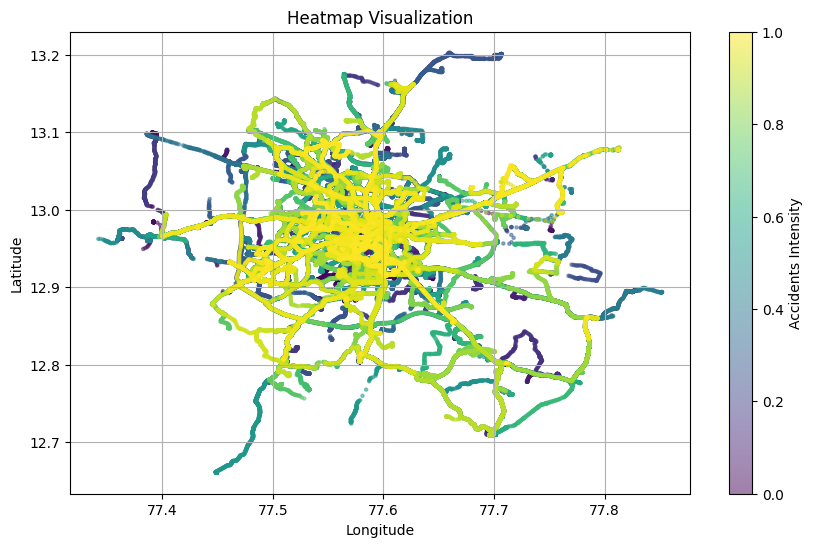

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Step 1: Remove rows with invalid latitude or longitude
df = df[(df['latitude01'] != 0) & (df['longitude01'] != 0)]
df = df[(df['latitude01'] >= -90) & (df['latitude01'] <= 90)]
df = df[(df['longitude01'] >= -180) & (df['longitude01'] <= 180)]

# Step 2: Extract latitude and longitude
latitude = df['latitude01']
longitude = df['longitude01']

# Step 3: Normalize data for coloring
normalized_indices = np.linspace(0, 1, len(df))

# Step 4: Plot the heatmap
plt.figure(figsize=(10, 6))

# Use the 'viridis' colormap from pyplot
colors = plt.cm.viridis(normalized_indices)

# Scatter plot with colors
scatter = plt.scatter(longitude, latitude, alpha=0.5, c=normalized_indices, cmap='viridis', s=5)

# Add a colorbar
plt.colorbar(scatter, label='Accidents Intensity')

# Customize plot elements for better visualization
plt.title("Heatmap Visualization")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)

# Show the plot
plt.show()


### Traffic Congestion Level

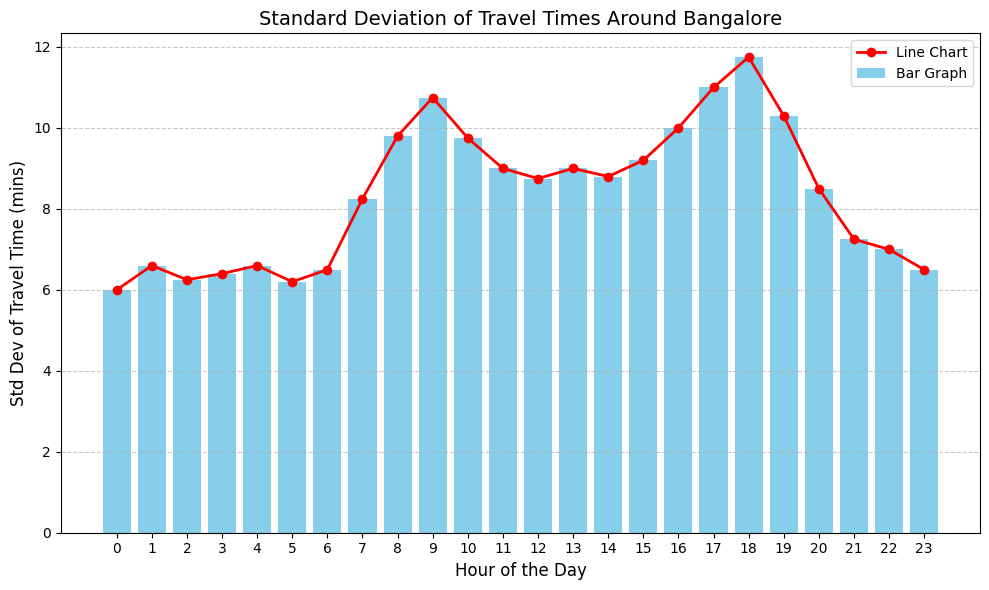

In [14]:
# Filepath to the CSV file
csv_filepath = "data/traffic_congestion.csv"

# Read data from the CSV file
hours = []
std_devs = []

with open(csv_filepath, mode='r') as file:
    reader = csv.reader(file)
    next(reader)  # Skip the header row
    for row in reader:
        hours.append(int(row[0]))  # Convert hour to integer
        std_devs.append(float(row[1]))  # Convert std dev to float

# Plot the bar graph
plt.figure(figsize=(10, 6))
plt.bar(hours, std_devs, color='skyblue', alpha=1.0, label='Bar Graph')

# Overlay the line chart
plt.plot(hours, std_devs, marker='o', color='red', label='Line Chart', linewidth=2)

# Add labels, title, and legend
plt.title('Standard Deviation of Travel Times Around Bangalore', fontsize=14)
plt.xlabel('Hour of the Day', fontsize=12)
plt.ylabel('Std Dev of Travel Time (mins)', fontsize=12)
plt.xticks(hours)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

 - The rush hours of Traffic Congestion in Bangalore is generally the peak office timings: 
    9 A.M. and  6 P.M.
 - The morning traffic starts from 7 till 9 then decreases gradually.
 - The evening rush starts from 3 slowly till 6 at peak and decreases eventually.

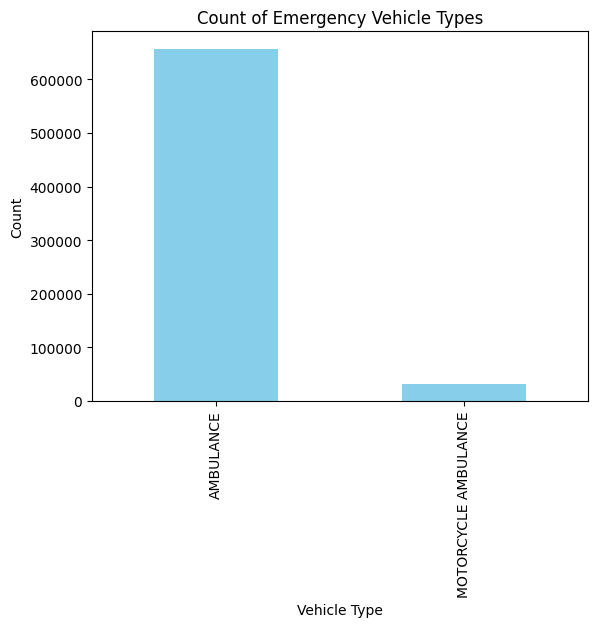

In [15]:
# Count of emergency vehicle types
vehicle_counts = df['emergencyVehicleType'].value_counts()

# Plot bar chart
vehicle_counts.plot(kind='bar', color='skyblue')
plt.title("Count of Emergency Vehicle Types")
plt.xlabel("Vehicle Type")
plt.ylabel("Count")
plt.show()


 - Still more than 

##### 3. Univariate Analysis (Histograms):
 - Analyze distributions of numeric features like response time or number of vehicles.

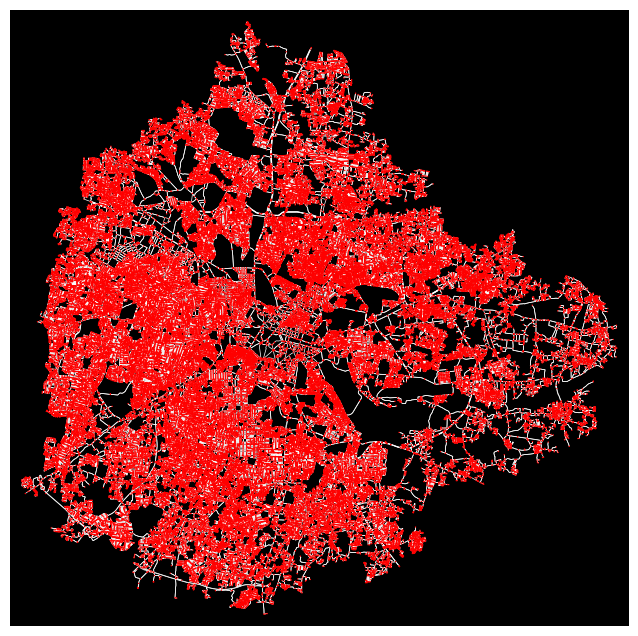

In [17]:
### ROAD NETWORKS BANGALORE
# Load Bengaluru road network
location = "Bengaluru, Karnataka, India"
graph = ox.graph_from_place(location, network_type='drive')

# Plot the road network
fig, ax = ox.plot_graph(graph, node_size=1, edge_linewidth=0.5, bgcolor="black", node_color='red', edge_color='white')
